<a href="https://colab.research.google.com/github/ayushpratap121/Machine-Learning-Algorithms-Materials/blob/main/ResNet50_TL_Running_all_img_(2).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Standard ResNet-50 Model for Model comaparison and evaluation of G10K_Dataset

#It implements the standard ResNet50 model on the G10K_Dataset

# Import libraries

In [ ]:
import numpy as np

from keras.models import Model
from keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, Conv2DTranspose, multiply, Lambda, add, Activation
from keras.layers import concatenate
from keras.optimizers import *
import keras.backend as K
from keras.callbacks import EarlyStopping
from keras.preprocessing import image
from keras.layers import Concatenate

import tensorflow as tf

import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.metrics import roc_curve, roc_auc_score, confusion_matrix
from sklearn.model_selection import KFold

import os
from os import listdir

import sys
sys.path.append('/home/ai1/miniconda3/envs/myenv/lib/python3.9/site-packages')
import natsort

import datetime
now = datetime.datetime.now

os.environ["CUDA_VISIBLE_DEVICES"] = "4" # Use the first GPU available
config = tf.compat.v1.ConfigProto()
config.gpu_options.allow_growth = True # Dynamically allocate memory
sess = tf.compat.v1.Session(config=config)
print("Tensorflow version:", tf.__version__)
print("Is GPU available:", tf.test.is_gpu_available(1))

2023-12-28 08:57:24.811474: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-12-28 08:57:27.120542: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


Tensorflow version: 2.11.0
Instructions for updating:
Use `tf.config.list_physical_devices('GPU')` instead.
Is GPU available: True


2023-12-28 08:57:29.759147: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1613] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 9679 MB memory:  -> device: 0, name: GeForce RTX 2080 Ti, pci bus id: 0000:20:00.0, compute capability: 7.5
2023-12-28 08:57:29.768322: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1613] Created device /device:GPU:0 with 9679 MB memory:  -> device: 0, name: GeForce RTX 2080 Ti, pci bus id: 0000:20:00.0, compute capability: 7.5


# Load the images from G10K_Dataset

In [ ]:
# Directory with images and ground truths
path_imgs = "/home/ai1/Ayush/Germany/all_1/img"
path_masks = "/home/ai1/Ayush/Germany/all_1/mask"


imagesList = listdir(path_imgs)
imagesList1=listdir(path_masks)
# Sort the images in ascending order
imgList=natsort.natsorted(imagesList)
imgList1=natsort.natsorted(imagesList1)
# Introduce parameters
img_row = 224
img_col = 224
img_chan = 1
epochnum = 200
batchnum = 5
input_size = (img_row, img_col, img_chan)

num_imgs = len(imgList)
num_mask = len(imgList1)
print("Number of images:", num_imgs)
print("Number of masks:", num_mask)

Number of images: 3234
Number of masks: 3234


In [ ]:
# Load the images
def img_load(dir_path, imgs_list, imgs_array):
    for i in range(num_imgs):
        tmp_img = tf.keras.preprocessing.image.load_img(os.path.join(dir_path, imgs_list[i]), target_size=(img_row, img_col, img_chan))
        img = tf.keras.preprocessing.image.img_to_array(tmp_img)
        imgs_array[i] = img[:,:,0]/255.0

    # Expand the dimensions of the arrays
    imgs_array = np.expand_dims(imgs_array, axis=3)
    return imgs_array

# Initialize the arrays
imgs = np.zeros((num_imgs, img_row, img_col))
masks = np.zeros_like(imgs)

imgs = img_load(path_imgs, imgList, imgs)
masks = img_load(path_masks, imgList1, masks)

print("Images", imgs.shape)
print("Masks", masks.shape)

Images (3234, 224, 224, 1)
Masks (3234, 224, 224, 1)


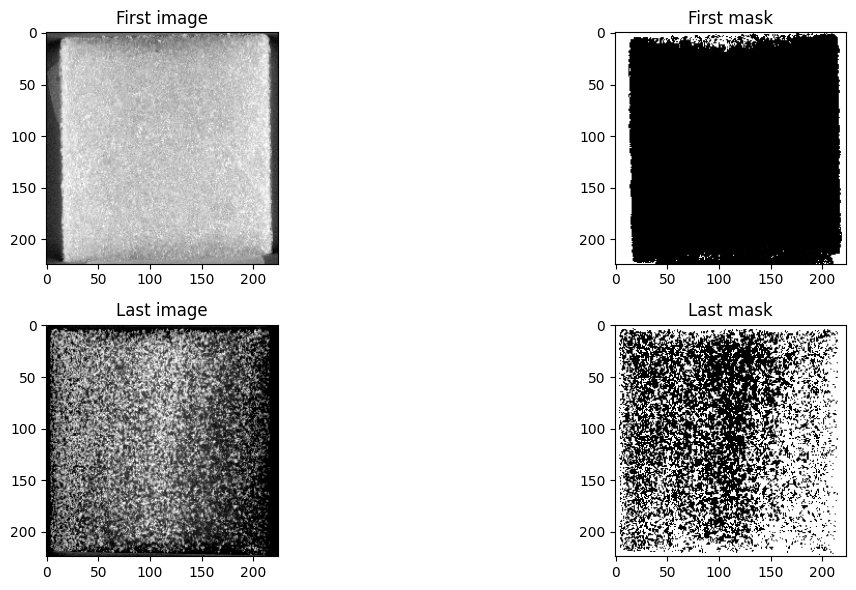

In [ ]:
# Plot the first and last images
plt.figure(figsize = (14,6))
plt.subplot(221)
plt.imshow(np.squeeze(imgs[0]), cmap = "gray")
plt.title('First image')
plt.subplot(222)
plt.imshow(np.squeeze(masks[0]), cmap = "gray")
plt.title('First mask')
plt.subplot(223)
plt.imshow(np.squeeze(imgs[-1]), cmap = "gray")
plt.title('Last image')
plt.subplot(224)
plt.imshow(np.squeeze(masks[-1]), cmap = "gray")
plt.title('Last mask')
plt.tight_layout()
plt.show()

# Performance metrics on G10K_Dataset

In [ ]:
# Define loss and performance metrics
# Marginally taken from :Aleksandar Vakanski et al -
# Attention Enriched Deep Learning Model for Breast Tumor Segmentation in Ultrasound Images
from keras.losses import binary_crossentropy
# Dice score coefficient and Dice loss
from keras.optimizers import Adam
from keras.callbacks import EarlyStopping
from keras.losses import binary_crossentropy
from keras.metrics import MeanIoU
import tensorflow.keras.backend as K

# Define the dsc function
def dsc(y_true, y_pred):
    smooth = 1.

    # Resize y_pred to match the spatial dimensions of y_true
    y_pred_resized = tf.image.resize(tf.cast(y_pred, dtype=tf.float32), (224, 224))

    y_true_f = K.flatten(tf.cast(y_true, dtype=tf.float32))
    y_pred_f = K.flatten(y_pred_resized)

    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)




# Define the dice_loss function
def dice_loss(y_true, y_pred):
    return 1 - dsc(y_true, y_pred)

# Define the bce_dice_loss function
def bce_dice_loss(y_true, y_pred):
    y_true = K.cast(y_true, dtype='float32')
    y_pred = K.cast(y_pred, dtype='float32')

    # Reshape tensors to avoid broadcasting issues
    y_true = K.reshape(y_true, (-1,))
    y_pred = K.reshape(y_pred, (-1,))

    return binary_crossentropy(y_true, y_pred) + dice_loss(y_true, y_pred)


from skimage.transform import resize

def auc(y_true, y_pred):
    y_true_resized = resize(y_true, y_pred.shape, mode='constant', anti_aliasing=False)
    y_pred_pos = np.round(np.clip(y_pred, 0, 1))
    y_pred_neg = 1 - y_pred_pos

    tp = np.sum(y_true_resized * y_pred_pos)
    tn = np.sum((1 - y_true_resized) * (1 - y_pred_pos))
    fp = np.sum((1 - y_true_resized) * y_pred_pos)
    fn = np.sum(y_true_resized * (1 - y_pred_pos))

    auc = (tp + tn) / (tp + tn + fp + fn)

    return auc

In [ ]:
import tensorflow as tf
from tensorflow.keras.losses import binary_crossentropy
from tensorflow.keras import backend as K

def combined_loss(y_true, y_pred):
    # Resize y_true to match the spatial dimensions of y_pred
    y_true_resized = tf.image.resize(y_true, (y_pred.shape[1], y_pred.shape[2]))

    # Binary cross-entropy loss
    bce_loss = binary_crossentropy(y_true_resized, y_pred)

    # Dice coefficient
    smooth = 1.
    y_true_f = K.flatten(y_true_resized)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    union = K.sum(y_true_f) + K.sum(y_pred_f) - intersection
    dice_loss = 1 - (2. * intersection + smooth) / (union + smooth)

    # Combine the losses
    alpha = 0.5  # You can adjust the weight of each loss
    combined_loss = alpha * bce_loss + (1 - alpha) * dice_loss

    return combined_loss

# ResNet 50 Network

In [ ]:
from keras.applications import VGG16 , ResNet50
from keras.layers import Input, Conv2D, MaxPooling2D, concatenate, Conv2DTranspose, UpSampling2D
from keras.models import Model
from tensorflow.keras.preprocessing.image import img_to_array, array_to_img
from sklearn.metrics import accuracy_score

# Assuming input_size is defined somewhere in your code
img_row = 224
img_col = 224
img_chan = 1
epochnum = 200
batchnum = 5
input_size_vgg = (224, 224, 3)  # VGG16 input size

# Sample image resizing, replace this with your actual data loading
sample_image = array_to_img(np.random.rand(img_row, img_col, img_chan) * 255.0, scale=False)
sample_image = sample_image.resize((input_size_vgg[0], input_size_vgg[1]))
sample_image = img_to_array(sample_image) / 255.0
sample_image = np.expand_dims(sample_image, axis=0)

def ConvBlock(x, filters):
    # Placeholder ConvBlock implementation
    x = Conv2D(filters, (3, 3), activation='relu', padding='same')(x)
    return x

def Network():
    # Modify input size to match the VGG16 input size
    input_tensor = Input(shape=input_size_vgg)

    # Load ResNet50 model with pre-trained ImageNet weights
    base_model = ResNet50(weights='imagenet', include_top=False, input_tensor=input_tensor)

    # Freeze the pre-trained layers
    for layer in base_model.layers:
        layer.trainable = False

    # Use the last convolutional layer of ResNet50 as the starting point for your U-Net
    conv5 = base_model.get_layer('conv5_block3_out').output

    up6 = concatenate([UpSampling2D(size=(2, 2))(conv5), base_model.get_layer('conv4_block6_out').output], axis=3)
    conv6 = ConvBlock(up6, 64)

    up7 = concatenate([UpSampling2D(size=(2, 2))(conv6), base_model.get_layer('conv3_block4_out').output], axis=3)
    conv7 = ConvBlock(up7, 64)

    up8 = concatenate([UpSampling2D(size=(2, 2))(conv7), base_model.get_layer('conv2_block3_out').output], axis=3)
    conv8 = ConvBlock(up8, 32)

    up9 = concatenate([UpSampling2D(size=(2, 2))(conv8), base_model.get_layer('conv1_relu').output], axis=3)
    conv9 = ConvBlock(up9, 32)

    conv10 = Conv2D(1, (1, 1), activation='sigmoid')(conv9)

    model = Model(inputs=input_tensor, outputs=conv10)

    return model

model = Network()
model.summary()

2023-12-28 08:58:11.301606: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1613] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 9679 MB memory:  -> device: 0, name: GeForce RTX 2080 Ti, pci bus id: 0000:20:00.0, compute capability: 7.5


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                              

# Training and cross-validation

Run # 1


/home/ai1/myenv/lib/python3.9/site-packages/keras/optimizers/optimizer_v2/adam.py:117: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)
2023-12-28 08:58:23.982494: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:428] Loaded cuDNN version 8800
2023-12-28 08:58:25.119669: W tensorflow/compiler/xla/stream_executor/gpu/asm_compiler.cc:115] *** WARNING *** You are using ptxas 10.0.145, which is older than 11.1. ptxas before 11.1 is known to miscompile XLA code, leading to incorrect results or invalid-address errors.

You may not need to update to CUDA 11.1; cherry-picking the ptxas binary is often sufficient.


Training time: 0:23:10.166037


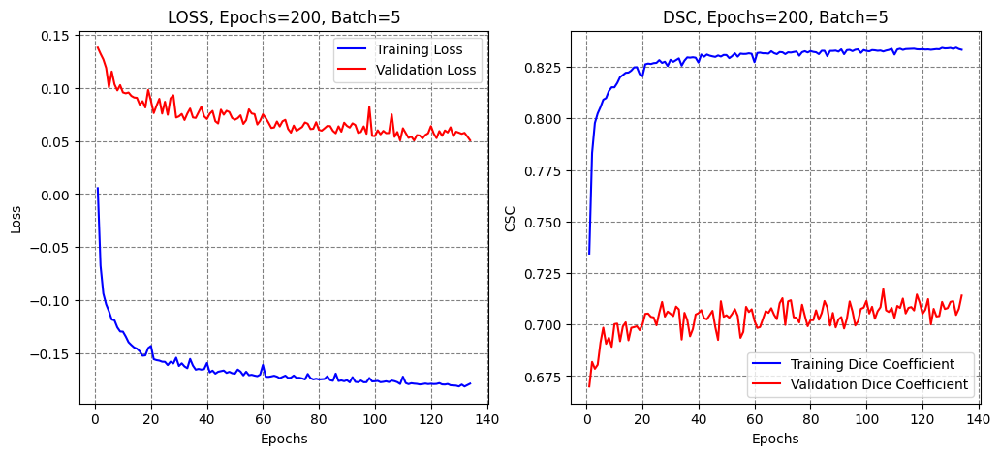

21/21 [==============================] - 3s 74ms/step
Testing time: 0:00:04.228509
------------------------------
USING THRESHOLD 0.5

 DSC 		0.831 
 IOU 		0.722 
 Recall 	0.831 
 Precision	0.831


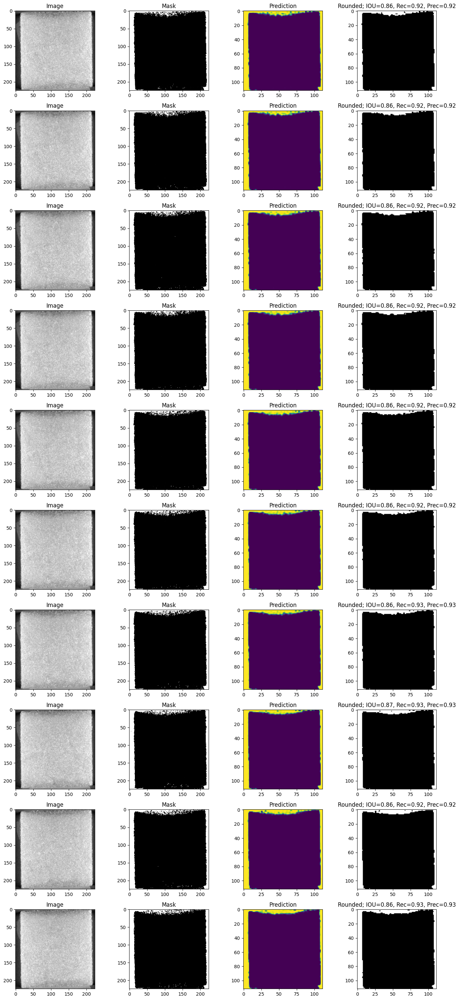

masks_test shape: (647, 224, 224, 1)
resized_preds shape: (647, 224, 224, 1)
 AUC ROC 	0.892


************************************************************
Run # 2


/home/ai1/myenv/lib/python3.9/site-packages/keras/optimizers/optimizer_v2/adam.py:117: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


Training time: 0:17:16.796941


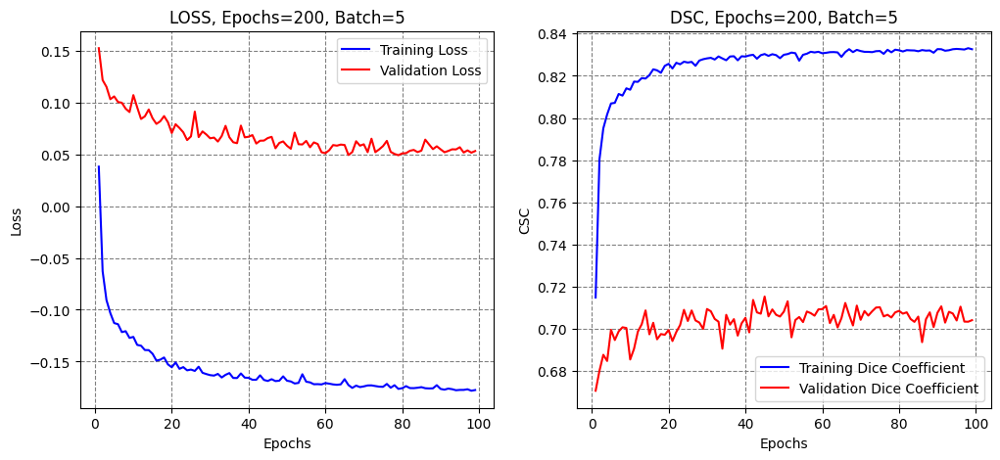

21/21 [==============================] - 2s 49ms/step
Testing time: 0:00:03.034476
------------------------------
USING THRESHOLD 0.5

 DSC 		0.831 
 IOU 		0.722 
 Recall 	0.831 
 Precision	0.831


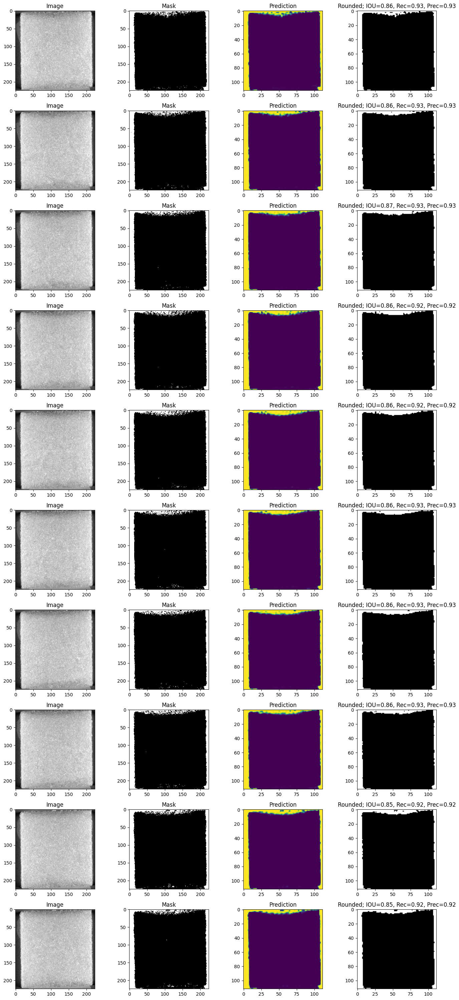

masks_test shape: (647, 224, 224, 1)
resized_preds shape: (647, 224, 224, 1)
 AUC ROC 	0.898


************************************************************
Run # 3


/home/ai1/myenv/lib/python3.9/site-packages/keras/optimizers/optimizer_v2/adam.py:117: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


Training time: 0:18:46.368637


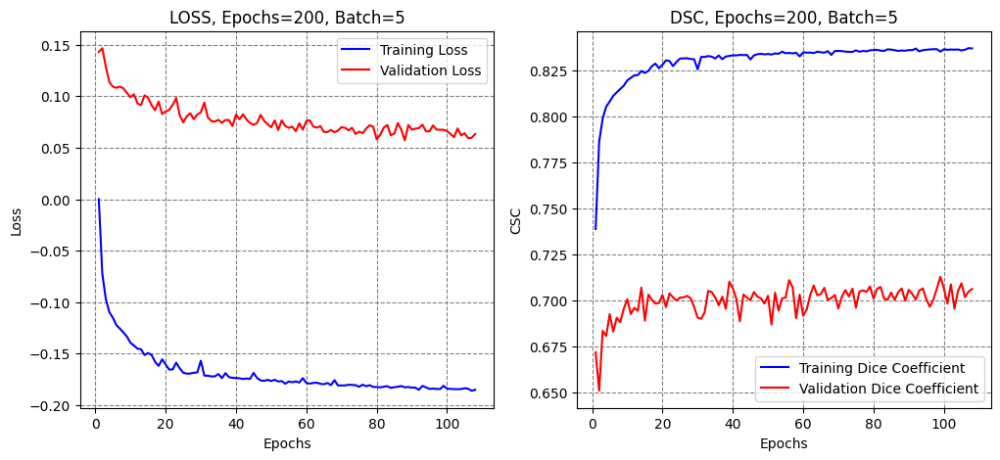

21/21 [==============================] - 2s 51ms/step
Testing time: 0:00:02.593134
------------------------------
USING THRESHOLD 0.5

 DSC 		0.823 
 IOU 		0.711 
 Recall 	0.823 
 Precision	0.823


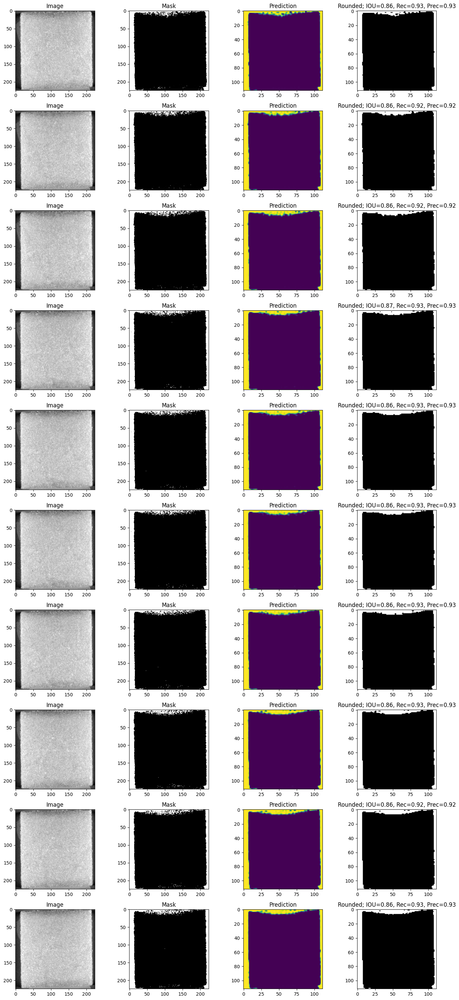

masks_test shape: (647, 224, 224, 1)
resized_preds shape: (647, 224, 224, 1)
 AUC ROC 	0.890


************************************************************
Run # 4


/home/ai1/myenv/lib/python3.9/site-packages/keras/optimizers/optimizer_v2/adam.py:117: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


Training time: 0:25:51.769252


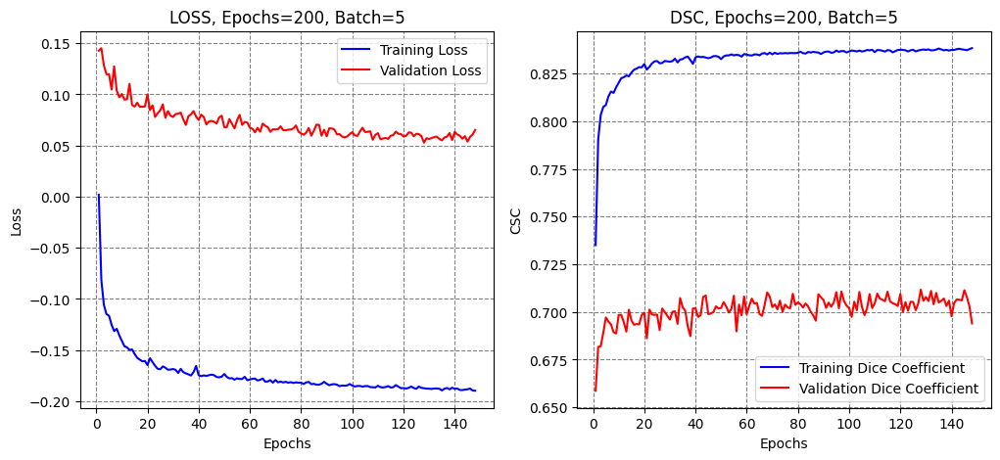

21/21 [==============================] - 2s 52ms/step
Testing time: 0:00:02.609466
------------------------------
USING THRESHOLD 0.5

 DSC 		0.822 
 IOU 		0.709 
 Recall 	0.822 
 Precision	0.822


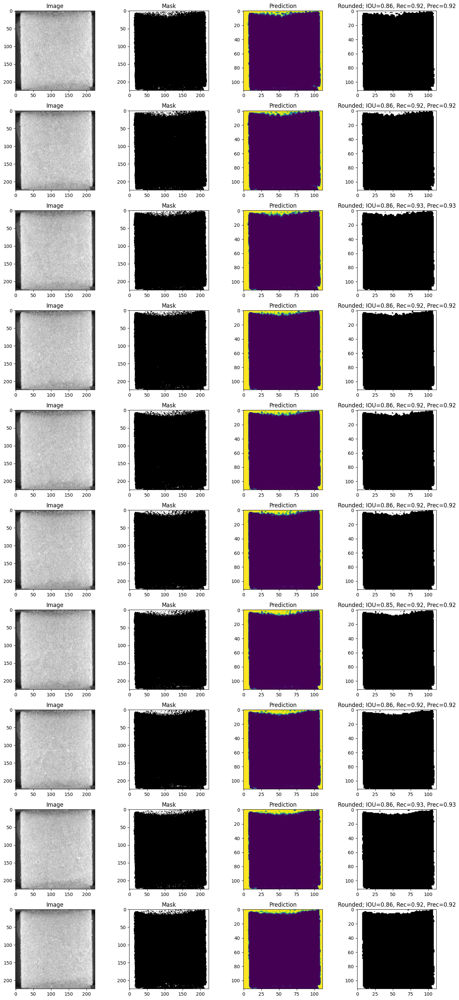

masks_test shape: (647, 224, 224, 1)
resized_preds shape: (647, 224, 224, 1)
 AUC ROC 	0.896


************************************************************
Run # 5


/home/ai1/myenv/lib/python3.9/site-packages/keras/optimizers/optimizer_v2/adam.py:117: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


Training time: 0:21:02.747121


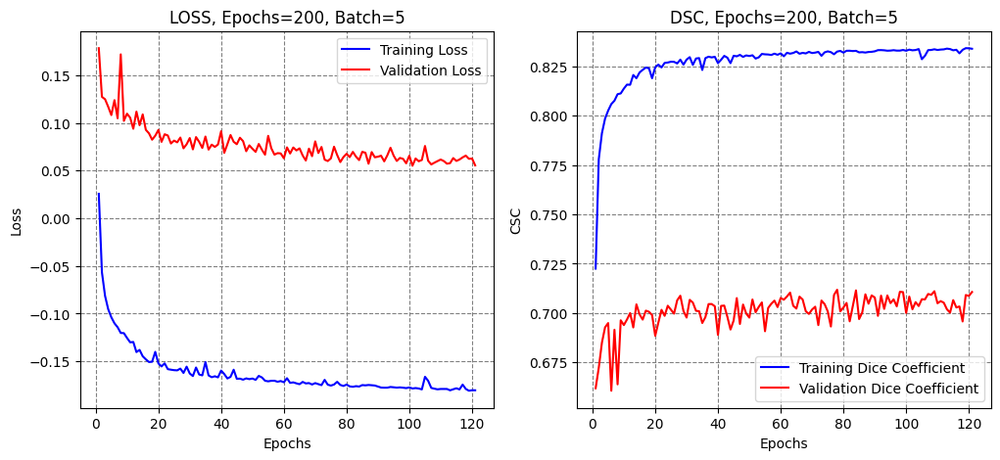

21/21 [==============================] - 3s 78ms/step
Testing time: 0:00:03.869127
------------------------------
USING THRESHOLD 0.5

 DSC 		0.833 
 IOU 		0.724 
 Recall 	0.833 
 Precision	0.833


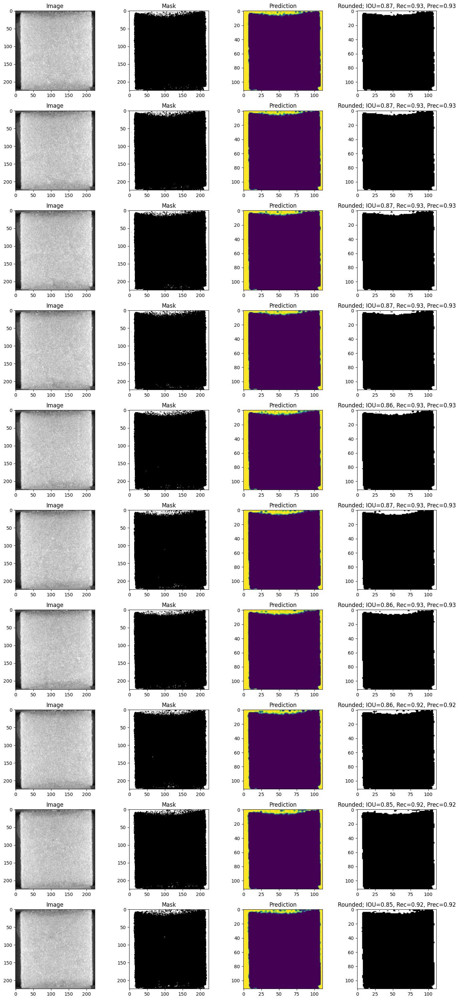

masks_test shape: (646, 224, 224, 1)
resized_preds shape: (646, 224, 224, 1)
 AUC ROC 	0.894


************************************************************


In [ ]:
import numpy as np
# Evaluate the models using using k-fold cross-validation
n_folds = 5

numepochs = np.zeros(n_folds,)
dice_score = np.zeros(n_folds,)
iou_score = np.zeros_like(dice_score)
rec_score = np.zeros_like(dice_score)
prec_score = np.zeros_like(dice_score)
globacc_score = np.zeros_like(dice_score)
auc_roc_score = np.zeros_like(dice_score)

# Prepare cross-validation
kfold = KFold(n_folds, shuffle=True, random_state=1)

run = 0;
# enumerate splits
for train_ix, test_ix in kfold.split(imgs):

    # Display the run number
    print('Run #', run+1)

    # Define  the model
    model = Network()

    # Split into train and test sets
    imgs_train, masks_train, imgs_test, masks_test = imgs[train_ix], masks[train_ix], imgs[test_ix], masks[test_ix]

    # Repeat the single-channel data along the channel axis
    imgs_train_rgb = np.repeat(imgs_train, 3, axis=-1)

    imgs_test_rgb = np.repeat(imgs_test, 3, axis=-1)


    # Compile and fit the  model
    model.compile(optimizer = Adam(lr = 0.0001), loss = combined_loss, metrics = [dsc])

    t = now()
    callbacks = [EarlyStopping(monitor='val_loss', patience = 20)]
    history = model.fit(imgs_train_rgb, masks_train, validation_split=0.15, batch_size=batchnum,
                        epochs=epochnum, verbose=0, callbacks=callbacks)

    print('Training time: %s' % (now() - t))

    # Plot the loss and accuracy
    train_loss = history.history['loss']
    val_loss = history.history['val_loss']
    acc = history.history['dsc']
    val_acc = history.history['val_dsc']

    epochsn = np.arange(1, len(train_loss)+1,1)
    plt.figure(figsize = (12,5))
    plt.subplot(121)
    plt.plot(epochsn,train_loss, 'b', label='Training Loss')
    plt.plot(epochsn,val_loss, 'r', label='Validation Loss')
    plt.grid(color='gray', linestyle='--')
    plt.legend()
    plt.title('LOSS, Epochs={}, Batch={}'.format(epochnum, batchnum))
    plt.xlabel('Epochs')
    plt.ylabel('Loss')

    plt.subplot(122)
    plt.plot(epochsn, acc, 'b', label='Training Dice Coefficient')
    plt.plot(epochsn, val_acc, 'r', label='Validation Dice Coefficient')
    plt.grid(color='gray', linestyle='--')
    plt.legend()
    plt.title('DSC, Epochs={}, Batch={}'.format(epochnum, batchnum))
    plt.xlabel('Epochs')
    plt.ylabel('CSC')
    plt.show()

    # Make predictions
    t = now()
    preds = model.predict(imgs_test_rgb)
    print('Testing time: %s' % (now() - t))

    # Evaluate model
    num_test = len(imgs_test)
    # Calculate performance metrics
    dsc_sc = np.zeros((num_test,1))
    iou_sc = np.zeros_like(dsc_sc)
    rec_sc = np.zeros_like(dsc_sc)
    tn_sc = np.zeros_like(dsc_sc)
    prec_sc = np.zeros_like(dsc_sc)
    thresh = 0.5

    for i in range(num_test):
        # Calculate Dice coefficient, IoU, Recall, and Precision
        dsc_sc[i] = dsc(masks_test[i], preds[i] > thresh)
        iou_sc[i] = np.sum(dsc_sc[i]) / (2 - dsc_sc[i])  # IoU from Dice coefficient
        rec_sc[i] = dsc_sc[i]
        prec_sc[i] = dsc_sc[i]

    print('-'*30)
    print('USING THRESHOLD', thresh)
    print('\n DSC \t\t{0:^.3f} \n IOU \t\t{1:^.3f} \n Recall \t{2:^.3f} \n Precision\t{3:^.3f}'.format(
            np.sum(dsc_sc)/num_test,
            np.sum(iou_sc)/num_test,
            np.sum(rec_sc)/num_test,
            np.sum(prec_sc)/num_test ))


    # To plot a set of images with predicted masks uncomment these lines
    num_disp = 10
    j=1
    plt.figure(figsize = (14,num_disp*3))
    for i in range(num_disp):
        plt.subplot(num_disp,4,j)
        plt.imshow(np.squeeze(imgs_test[i]), cmap='gray')
        plt.title('Image')
        j +=1
        plt.subplot(num_disp,4,j)
        plt.imshow(np.squeeze(masks_test[i]),cmap='gray')
        plt.title('Mask')
        j +=1
        plt.subplot(num_disp,4,j)
        plt.imshow(np.squeeze(preds[i]))
        plt.title('Prediction')
        j +=1
        plt.subplot(num_disp,4,j)
        plt.imshow(np.squeeze(np.round(preds[i])), cmap='gray')
        plt.title('Rounded; IOU=%0.2f, Rec=%0.2f, Prec=%0.2f' %(iou_sc[i], rec_sc[i], prec_sc[i]))
        j +=1
    plt.tight_layout()
    plt.show()


    # Confusion matrix
    '''confusion = confusion_matrix( masks_test.ravel(),preds.ravel()>thresh)
    accuracy = 0
    if float(np.sum(confusion))!=0:
        accuracy = float(confusion[0,0]+confusion[1,1])/float(np.sum(confusion))
    print(' Global Acc \t{0:^.3f}'.format(accuracy))'''

    from skimage.transform import resize
    from sklearn.metrics import roc_auc_score

    # Resize preds to match the shape of masks_test
    resized_preds = np.zeros_like(masks_test)
    for i in range(len(preds)):
        resized_preds[i] = resize(preds[i], masks_test[i].shape, mode='constant', anti_aliasing=False)

    # Print shapes for debugging
    print("masks_test shape:", masks_test.shape)
    print("resized_preds shape:", resized_preds.shape)

    # Ensure masks_test and resized_preds have the same length
    assert masks_test.ravel().shape == resized_preds.ravel().shape, "Inconsistent number of samples"

    # Thresholding
    thresholded_preds = (resized_preds > thresh).astype(int)
    thresholded_masks = (masks_test > 0.5).astype(int)  # Assuming masks are in the range [0, 1]

    # Calculate ROC AUC score using thresholded_preds
    AUC_ROC = roc_auc_score(thresholded_masks.ravel(), thresholded_preds.ravel())
    print(' AUC ROC \t{0:^.3f}'.format(AUC_ROC))
    print('\n')
    print('*'*60)

    # Save outputs
    numepochs[run] = epochsn[-1]
    dice_score[run] = np.sum(dsc_sc)/num_test
    iou_score[run] = np.sum(iou_sc)/num_test
    rec_score[run] = np.sum(rec_sc)/num_test
    prec_score[run] = np.sum(prec_sc)/num_test
   # globacc_score[run] = accuracy
    auc_roc_score[run] = AUC_ROC
    run +=1

# Display the Results

In [ ]:
# Display the scores in a table
import pandas
from pandas import DataFrame
df = DataFrame({'Epochs Number': numepochs, 'Dice Score': dice_score, 'IOU Score': iou_score, 'Recall (Sensitivity)': rec_score, 'Precision': prec_score, 'Global Accuracy': globacc_score, 'AUC-ROC': auc_roc_score})
df

,Epochs Number,Dice Score,IOU Score,Recall (Sensitivity),Precision,Global Accuracy,AUC-ROC
0,134.0,0.831296,0.722161,0.831296,0.831296,0.0,0.891748
1,99.0,0.831378,0.722407,0.831378,0.831378,0.0,0.897927
2,108.0,0.823302,0.710593,0.823302,0.823302,0.0,0.889583
3,148.0,0.821977,0.708724,0.821977,0.821977,0.0,0.896425
4,121.0,0.832726,0.724256,0.832726,0.832726,0.0,0.894006


In [ ]:
# Calculate mean values of the scores
numepochs_mean = np.mean(numepochs)
dice_mean = np.mean(dice_score)
iou_mean = np.mean(iou_score)
rec_mean = np.mean(rec_score)
prec_mean = np.mean(prec_score)
globacc_mean = np.mean(globacc_score)
auc_roc_mean = np.mean(auc_roc_score)

# Mean values of the scores
df2 = DataFrame({'Epochs Number Mean': numepochs_mean, 'Dice Score Mean': dice_mean, 'IOU Score Mean': iou_mean, 'Recall (Sensitivity) Mean': rec_mean, 'Precision Mean': prec_mean, 'Global Accuracy Mean': globacc_mean, 'AUC-ROC Mean': auc_roc_mean},index=[5])
df2

,Epochs Number Mean,Dice Score Mean,IOU Score Mean,Recall (Sensitivity) Mean,Precision Mean,Global Accuracy Mean,AUC-ROC Mean
5,122.0,0.828136,0.717628,0.828136,0.828136,0.0,0.893938


In [ ]:
# Calculate standard deviations of the scores
dice_std = np.std(dice_score)
iou_std = np.std(iou_score)
rec_std = np.std(rec_score)
prec_std = np.std(prec_score)
globacc_std = np.std(globacc_score)
auc_roc_std = np.std(auc_roc_score)


# Standard deviations of the scores
df3 = DataFrame({'Dice Score STD': dice_std, 'IOU Score STD': iou_std, 'Recall (Sensitivity) STD': rec_std, 'Precision STD': prec_std, 'Global Accuracy STD': globacc_std, 'AUC-ROC STD': auc_roc_std}, index=[5])
df3

,Dice Score STD,IOU Score STD,Recall (Sensitivity) STD,Precision STD,Global Accuracy STD,AUC-ROC STD
5,0.004535,0.006574,0.004535,0.004535,0.0,0.003029
